# GRID Sweep - Badanie wpływu hiperparametrów
Poniższy notatnik pozwala na wizualizację i zapis wyników eksperymentów izolujących jeden konkretny parametr. Eksperymenty zostały pogrupowane dla każdego z 4 modeli.

In [2]:
import sys
import os
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import display, HTML

# =========================================================
# AUTOMATYCZNE WYKRYWANIE GŁÓWNEGO FOLDERU PROJEKTU
# =========================================================
if os.path.exists('2_Experiments'):
    PROJECT_ROOT = '.'
elif os.path.exists('../2_Experiments'):
    PROJECT_ROOT = '..'
elif os.path.exists('/content/Praca_magisterska/Praca_magisterska/2_Experiments'):
    PROJECT_ROOT = '/content/Praca_magisterska/Praca_magisterska'
else:
    raise RuntimeError("Nie znaleziono folderu 2_Experiments. Upewnij się, że repozytorium jest pobrane/zamontowane.")

print(f"Ścieżka główna projektu to: {os.path.abspath(PROJECT_ROOT)}")

sys.path.append(os.path.join(PROJECT_ROOT, '2_Experiments'))
from utils.recbole_patch import apply_patches
apply_patches()

from recbole.quick_start import run_recbole

# Uniwersalna funkcja pomocnicza
def run_and_plot_sweep(model_name, config_file_relative, param_name, param_values, dataset='ml-100k', metric='ndcg@10'):
    print(f"\n{'='*60}\n🚀 BADANIE PARAMETRU: {param_name} (Wartości: {param_values})\n{'='*60}")
    results = []
    
    config_file = os.path.join(PROJECT_ROOT, config_file_relative)
    
    for val in param_values:
        print(f" -> Trenowanie {model_name} z {param_name} = {val}...")
        config_dict = {
            param_name: val,
            'checkpoint_dir': os.path.join(PROJECT_ROOT, '3_Evaluation/Saved/'),
            'state': 'WARNING',
            'use_gpu': True,
            'gpu_id': '0',
            'device': 'cuda'
        }
        try:
            res_dict = run_recbole(model=model_name, dataset=dataset, config_file_list=[config_file],
                                   config_dict=config_dict, saved=False)
            score = res_dict.get('test_result', {}).get(metric, 0.0)
            results.append({param_name: val, metric: float(score)})
        except Exception as e:
            print(f" [BŁĄD] {e}")
            
    if not results:
        return
        
    df = pd.DataFrame(results)
    
    reports_dir = os.path.join(PROJECT_ROOT, '3_Evaluation/Reports/')
    os.makedirs(reports_dir, exist_ok=True)
    df.to_csv(os.path.join(reports_dir, f'sweep_{model_name.lower()}_{param_name}.csv'), index=False)
    
    display(df)
    
    plt.figure(figsize=(7, 4))
    plt.plot([str(v) for v in df[param_name]], df[metric], marker='o', linewidth=2.5, markersize=8, color='#ff7f0e')
    plt.title(f"Wpływ '{param_name}' na metrykę {metric}\n(Model: {model_name})", fontsize=12)
    plt.xlabel(param_name, fontsize=10)
    plt.ylabel(metric, fontsize=10)
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.margins(0.1)
    plt.savefig(os.path.join(reports_dir, f'sweep_{model_name.lower()}_{param_name}.png'), dpi=300, bbox_inches='tight')
    plt.show()

Ścieżka główna projektu to: c:\Users\jakub\Documents\Materialy_na_studia\Informatyka_i_Ekonometria\Studia_Magisterskie\Praca_magisterska


2026-08-22 01:38:32,710	INFO util.py:154 -- Missing packages: ['ipywidgets']. Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2026-08-22 01:38:33,795	INFO util.py:154 -- Missing packages: ['ipywidgets']. Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.


## 1. ItemKNN
Badanie tabelaryczne i wykresy liniowe wpływu głównych parametrów metody k-Najbliższych Sąsiadów (k-Nearest Neighbors).


🚀 BADANIE PARAMETRU: k (Wartości: [10, 50, 100, 150, 200])
 -> Trenowanie ItemKNN z k = 10...


Evaluate   :   0%|                                                          | 0/315 [00:00<?, ?it/s]:  54%|████████████████████████▊                     | 170/315 [00:00<00:00, 1679.84it/s]: 100%|██████████████████████████████████████████████| 315/315 [00:00<00:00, 1873.03it/s]


 -> Trenowanie ItemKNN z k = 50...


Evaluate   :   0%|                                                          | 0/315 [00:00<?, ?it/s]:  42%|███████████████████▏                          | 131/315 [00:00<00:00, 1276.80it/s]:  94%|███████████████████████████████████████████▎  | 297/315 [00:00<00:00, 1491.30it/s]: 100%|██████████████████████████████████████████████| 315/315 [00:00<00:00, 1460.22it/s]


 -> Trenowanie ItemKNN z k = 100...


Evaluate   :   0%|                                                          | 0/315 [00:00<?, ?it/s]:  33%|███████████████▏                              | 104/315 [00:00<00:00, 1036.18it/s]:  77%|███████████████████████████████████▋          | 244/315 [00:00<00:00, 1248.30it/s]: 100%|██████████████████████████████████████████████| 315/315 [00:00<00:00, 1239.79it/s]


 -> Trenowanie ItemKNN z k = 150...


Evaluate   :   0%|                                                          | 0/315 [00:00<?, ?it/s]:  31%|██████████████▉                                 | 98/315 [00:00<00:00, 971.55it/s]:  75%|██████████████████████████████████▎           | 235/315 [00:00<00:00, 1201.11it/s]: 100%|██████████████████████████████████████████████| 315/315 [00:00<00:00, 1203.83it/s]


 -> Trenowanie ItemKNN z k = 200...


Evaluate   :   0%|                                                          | 0/315 [00:00<?, ?it/s]:  35%|████████████████▏                             | 111/315 [00:00<00:00, 1099.00it/s]:  70%|████████████████████████████████▎             | 221/315 [00:00<00:00, 1071.50it/s]: 100%|██████████████████████████████████████████████| 315/315 [00:00<00:00, 1082.92it/s]


,k,ndcg@10
0,10,0.2510
1,50,0.2667
2,100,0.2742
3,150,0.2770
4,200,0.2794


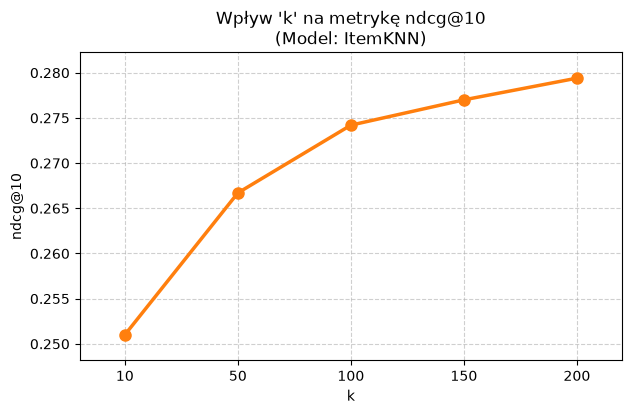

In [2]:
# Badanie liczby sąsiadów (k)
run_and_plot_sweep('ItemKNN', '2_Experiments/Configs/itemknn.yaml', 'k', [10, 50, 100, 150, 200])


🚀 BADANIE PARAMETRU: shrink (Wartości: [0.0, 2.5, 5.0, 7.5, 10.0])
 -> Trenowanie ItemKNN z shrink = 0.0...


Evaluate   :   0%|                                                          | 0/315 [00:00<?, ?it/s]:  22%|██████████▋                                     | 70/315 [00:00<00:00, 647.10it/s]:  56%|██████████████████████████▍                    | 177/315 [00:00<00:00, 872.73it/s]:  90%|██████████████████████████████████████████     | 282/315 [00:00<00:00, 925.09it/s]: 100%|███████████████████████████████████████████████| 315/315 [00:00<00:00, 853.95it/s]


 -> Trenowanie ItemKNN z shrink = 2.5...


Evaluate   :   0%|                                                          | 0/315 [00:00<?, ?it/s]:  24%|███████████▍                                    | 75/315 [00:00<00:00, 707.11it/s]:  52%|████████████████████████▍                      | 164/315 [00:00<00:00, 807.63it/s]:  80%|█████████████████████████████████████▌         | 252/315 [00:00<00:00, 828.85it/s]: 100%|███████████████████████████████████████████████| 315/315 [00:00<00:00, 792.85it/s]


 -> Trenowanie ItemKNN z shrink = 5.0...


Evaluate   :   0%|                                                          | 0/315 [00:00<?, ?it/s]:  19%|████████▉                                       | 59/315 [00:00<00:00, 588.88it/s]:  47%|██████████████████████▏                        | 149/315 [00:00<00:00, 762.11it/s]:  75%|███████████████████████████████████▏           | 236/315 [00:00<00:00, 809.74it/s]: 100%|███████████████████████████████████████████████| 315/315 [00:00<00:00, 753.02it/s]


 -> Trenowanie ItemKNN z shrink = 7.5...


Evaluate   :   0%|                                                          | 0/315 [00:00<?, ?it/s]:  25%|████████████                                    | 79/315 [00:00<00:00, 768.76it/s]:  51%|███████████████████████▊                       | 160/315 [00:00<00:00, 783.41it/s]:  78%|████████████████████████████████████▋          | 246/315 [00:00<00:00, 799.76it/s]: 100%|███████████████████████████████████████████████| 315/315 [00:00<00:00, 742.59it/s]


 -> Trenowanie ItemKNN z shrink = 10.0...


Evaluate   :   0%|                                                          | 0/315 [00:00<?, ?it/s]:  26%|████████████▍                                   | 82/315 [00:00<00:00, 757.13it/s]:  56%|██████████████████████████                     | 175/315 [00:00<00:00, 834.59it/s]:  82%|██████████████████████████████████████▋        | 259/315 [00:00<00:00, 776.26it/s]: 100%|███████████████████████████████████████████████| 315/315 [00:00<00:00, 793.07it/s]


,shrink,ndcg@10
0,0.0,0.2742
1,2.5,0.2735
2,5.0,0.2722
3,7.5,0.2734
4,10.0,0.2726


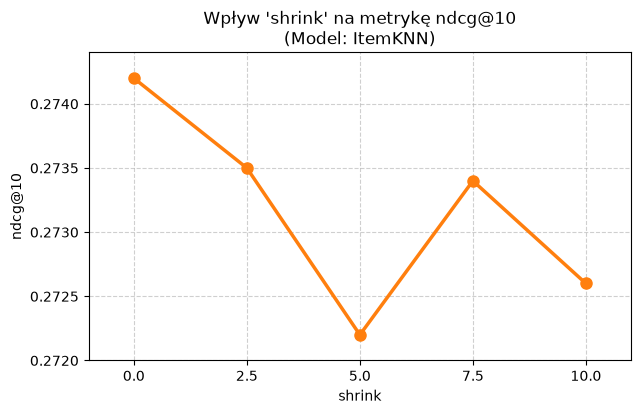

In [5]:
# Badanie parametru shrink (kara za małą liczbę wspólnych ocen)
run_and_plot_sweep('ItemKNN', '2_Experiments/Configs/itemknn.yaml', 'shrink', [0.0, 2.5, 5.0, 7.5, 10.0])

## 2. BPR-MF (Bayesian Personalized Ranking)
Analiza wpływu rozmiaru wektora osadzeń (embedding_size) oraz współczynnika uczenia (learning_rate).


🚀 BADANIE PARAMETRU: learning_rate (Wartości: [0.01, 0.005, 0.001, 0.0005, 0.0001])
 -> Trenowanie BPR z learning_rate = 0.01...


Evaluate   :   0%|                                                          | 0/315 [00:00<?, ?it/s]:  80%|████████████████████████████████████▉         | 253/315 [00:00<00:00, 2488.37it/s]: 100%|██████████████████████████████████████████████| 315/315 [00:00<00:00, 2309.06it/s]


 -> Trenowanie BPR z learning_rate = 0.005...


Evaluate   :   0%|                                                          | 0/315 [00:00<?, ?it/s]:  65%|█████████████████████████████▉                | 205/315 [00:00<00:00, 1876.33it/s]: 100%|██████████████████████████████████████████████| 315/315 [00:00<00:00, 2006.37it/s]


 -> Trenowanie BPR z learning_rate = 0.001...


Evaluate   :   0%|                                                          | 0/315 [00:00<?, ?it/s]:  55%|█████████████████████████▎                    | 173/315 [00:00<00:00, 1725.33it/s]: 100%|██████████████████████████████████████████████| 315/315 [00:00<00:00, 1713.41it/s]


 -> Trenowanie BPR z learning_rate = 0.0005...


Evaluate   :   0%|                                                          | 0/315 [00:00<?, ?it/s]:  75%|██████████████████████████████████▍           | 236/315 [00:00<00:00, 2188.38it/s]: 100%|██████████████████████████████████████████████| 315/315 [00:00<00:00, 2069.78it/s]


 -> Trenowanie BPR z learning_rate = 0.0001...


Evaluate   :   0%|                                                          | 0/315 [00:00<?, ?it/s]:  82%|█████████████████████████████████████▊        | 259/315 [00:00<00:00, 2330.60it/s]: 100%|██████████████████████████████████████████████| 315/315 [00:00<00:00, 2160.27it/s]


,learning_rate,ndcg@10
0,0.0100,0.1800
1,0.0050,0.2231
2,0.0010,0.2768
3,0.0005,0.2867
4,0.0001,0.2519


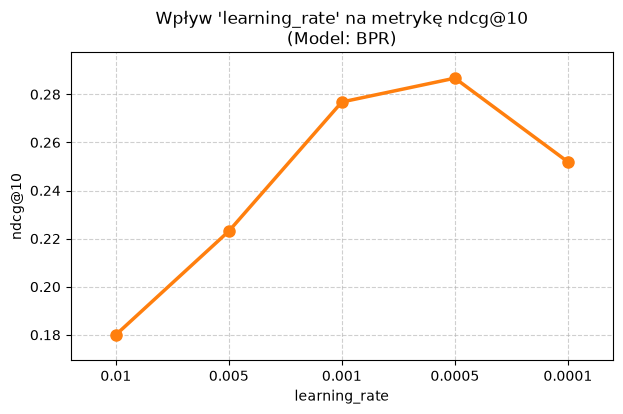

In [6]:
# Badanie współczynnika uczenia (learning_rate)
run_and_plot_sweep('BPR', '2_Experiments/Configs/bpr.yaml', 'learning_rate', [0.01, 0.005, 0.001, 0.0005, 0.0001])


🚀 BADANIE PARAMETRU: embedding_size (Wartości: [64, 128, 256])
 -> Trenowanie BPR z embedding_size = 64...


Evaluate   :   0%|                                                          | 0/315 [00:00<?, ?it/s]: 100%|██████████████████████████████████████████████| 315/315 [00:00<00:00, 3764.75it/s]


 -> Trenowanie BPR z embedding_size = 128...


Evaluate   :   0%|                                                          | 0/315 [00:00<?, ?it/s]: 100%|██████████████████████████████████████████████| 315/315 [00:00<00:00, 3748.40it/s]


 -> Trenowanie BPR z embedding_size = 256...


Evaluate   :   0%|                                                          | 0/315 [00:00<?, ?it/s]:  83%|██████████████████████████████████████        | 261/315 [00:00<00:00, 2584.77it/s]: 100%|██████████████████████████████████████████████| 315/315 [00:00<00:00, 2261.50it/s]


,embedding_size,ndcg@10
0,64,0.2761
1,128,0.2768
2,256,0.2728


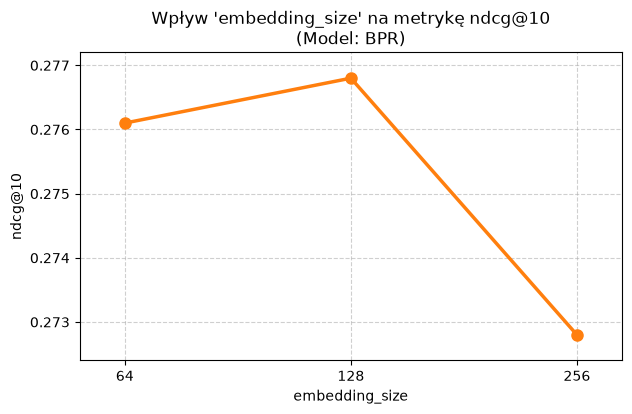

In [12]:
# Badanie wielkości wektora ukrytego (embedding_size)
run_and_plot_sweep('BPR', '2_Experiments/Configs/bpr.yaml', 'embedding_size', [64, 128, 256])

## 3. NeuMF (Neural Matrix Factorization)
Badanie zachowania architektury opartej o sieci głębokie przy modyfikacji hiperparametrów.


🚀 BADANIE PARAMETRU: learning_rate (Wartości: [0.001, 0.0005, 0.0001, 5e-05, 1e-05])
 -> Trenowanie NeuMF z learning_rate = 0.001...


Evaluate   :   0%|                                                          | 0/315 [00:00<?, ?it/s]:   5%|██▌                                             | 17/315 [00:00<00:01, 166.05it/s]:  11%|█████▏                                          | 34/315 [00:00<00:01, 159.79it/s]:  16%|███████▊                                        | 51/315 [00:00<00:01, 163.70it/s]:  22%|██████████▎                                     | 68/315 [00:00<00:01, 160.31it/s]:  27%|████████████▉                                   | 85/315 [00:00<00:01, 161.90it/s]:  33%|███████████████▋                               | 105/315 [00:00<00:01, 166.88it/s]:  39%|██████████████████▏                            | 122/315 [00:00<00:01, 166.71it/s]:  44%|████████████████████▋                          | 139/315 [00:00<00:01, 167.26it/s]:  50%|███████████████████████▎                       | 156/315 [00:00<00:00, 161.28it/s]:  55%|█████████████████████████▊                     | 173/315 [00:01<00:00, 163.09it/s]:  60%|███

 -> Trenowanie NeuMF z learning_rate = 0.0005...


Evaluate   :   0%|                                                          | 0/315 [00:00<?, ?it/s]:   6%|██▉                                             | 19/315 [00:00<00:01, 187.44it/s]:  12%|█████▊                                          | 38/315 [00:00<00:01, 144.02it/s]:  17%|████████▏                                       | 54/315 [00:00<00:02, 121.08it/s]:  22%|██████████▋                                     | 70/315 [00:00<00:01, 132.68it/s]:  28%|█████████████▎                                  | 87/315 [00:00<00:01, 143.99it/s]:  33%|███████████████▎                               | 103/315 [00:00<00:01, 148.58it/s]:  38%|█████████████████▉                             | 120/315 [00:00<00:01, 154.56it/s]:  43%|████████████████████▎                          | 136/315 [00:00<00:01, 154.79it/s]:  48%|██████████████████████▋                        | 152/315 [00:01<00:01, 155.72it/s]:  53%|█████████████████████████                      | 168/315 [00:01<00:00, 156.96it/s]:  58%|███

 -> Trenowanie NeuMF z learning_rate = 0.0001...


Evaluate   :   0%|                                                          | 0/315 [00:00<?, ?it/s]:   6%|██▉                                             | 19/315 [00:00<00:01, 187.10it/s]:  12%|█████▊                                          | 38/315 [00:00<00:01, 140.29it/s]:  17%|████████                                        | 53/315 [00:00<00:01, 142.02it/s]:  23%|██████████▊                                     | 71/315 [00:00<00:01, 154.44it/s]:  28%|█████████████▍                                  | 88/315 [00:00<00:01, 156.95it/s]:  34%|███████████████▊                               | 106/315 [00:00<00:01, 163.37it/s]:  39%|██████████████████▎                            | 123/315 [00:00<00:01, 164.94it/s]:  45%|█████████████████████                          | 141/315 [00:00<00:01, 166.52it/s]:  51%|████████████████████████                       | 161/315 [00:00<00:00, 173.07it/s]:  57%|██████████████████████████▋                    | 179/315 [00:01<00:00, 173.63it/s]:  63%|███

 -> Trenowanie NeuMF z learning_rate = 5e-05...


Evaluate   :   0%|                                                          | 0/315 [00:00<?, ?it/s]:   6%|██▋                                             | 18/315 [00:00<00:01, 173.62it/s]:  11%|█████▍                                          | 36/315 [00:00<00:01, 157.86it/s]:  17%|███████▉                                        | 52/315 [00:00<00:01, 150.76it/s]:  22%|██████████▎                                     | 68/315 [00:00<00:01, 153.92it/s]:  27%|████████████▉                                   | 85/315 [00:00<00:01, 157.86it/s]:  32%|███████████████▏                               | 102/315 [00:00<00:01, 160.37it/s]:  38%|█████████████████▊                             | 119/315 [00:00<00:01, 160.15it/s]:  43%|████████████████████▎                          | 136/315 [00:00<00:01, 160.47it/s]:  49%|██████████████████████▊                        | 153/315 [00:00<00:01, 161.02it/s]:  54%|█████████████████████████▎                     | 170/315 [00:01<00:00, 161.06it/s]:  59%|███

 -> Trenowanie NeuMF z learning_rate = 1e-05...


Evaluate   :   0%|                                                          | 0/315 [00:00<?, ?it/s]:   9%|████▎                                           | 28/315 [00:00<00:01, 274.56it/s]:  18%|████████▌                                       | 56/315 [00:00<00:01, 251.47it/s]:  26%|████████████▍                                   | 82/315 [00:00<00:01, 200.85it/s]:  34%|███████████████▉                               | 107/315 [00:00<00:00, 215.19it/s]:  42%|███████████████████▊                           | 133/315 [00:00<00:00, 226.71it/s]:  50%|███████████████████████▍                       | 157/315 [00:00<00:00, 230.12it/s]:  57%|███████████████████████████                    | 181/315 [00:00<00:00, 230.15it/s]:  65%|██████████████████████████████▋                | 206/315 [00:00<00:00, 235.99it/s]:  73%|██████████████████████████████████▎            | 230/315 [00:01<00:00, 220.07it/s]:  80%|█████████████████████████████████████▋         | 253/315 [00:01<00:00, 212.44it/s]:  88%|███

,learning_rate,ndcg@10
0,0.00100,0.2395
1,0.00050,0.2758
2,0.00010,0.2810
3,0.00005,0.2395
4,0.00001,0.1358


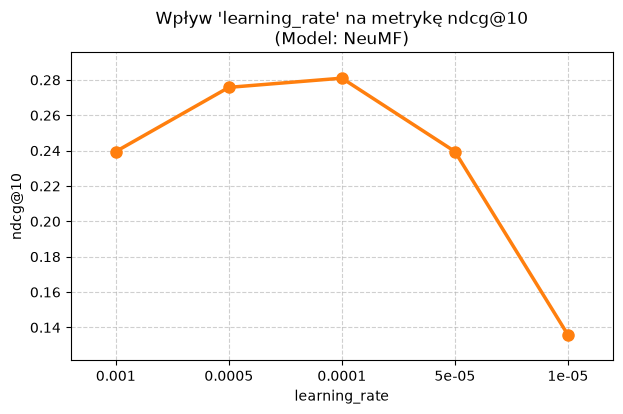

In [11]:
# Badanie współczynnika uczenia
run_and_plot_sweep('NeuMF', '2_Experiments/Configs/ncf.yaml', 'learning_rate', [0.001, 0.0005, 0.0001, 0.00005, 0.00001])


🚀 BADANIE PARAMETRU: mlp_hidden_size (Wartości: ['[64,32,16]', '[128,64,32]', '[256,128,64]'])
 -> Trenowanie NeuMF z mlp_hidden_size = [64,32,16]...


Evaluate   :   0%|                                                          | 0/315 [00:00<?, ?it/s]:   7%|███▏                                            | 21/315 [00:00<00:01, 203.30it/s]:  13%|██████▍                                         | 42/315 [00:00<00:01, 203.27it/s]:  20%|█████████▌                                      | 63/315 [00:00<00:01, 205.66it/s]:  27%|████████████▉                                   | 85/315 [00:00<00:01, 209.47it/s]:  34%|███████████████▉                               | 107/315 [00:00<00:00, 211.51it/s]:  41%|███████████████████▏                           | 129/315 [00:00<00:00, 209.86it/s]:  49%|██████████████████████▊                        | 153/315 [00:00<00:00, 209.78it/s]:  56%|██████████████████████████                     | 175/315 [00:00<00:00, 211.20it/s]:  63%|█████████████████████████████▍                 | 197/315 [00:00<00:00, 213.01it/s]:  70%|████████████████████████████████▋              | 219/315 [00:01<00:00, 209.81it/s]:  76%|███

 -> Trenowanie NeuMF z mlp_hidden_size = [128,64,32]...


Evaluate   :   0%|                                                          | 0/315 [00:00<?, ?it/s]:   6%|██▉                                             | 19/315 [00:00<00:01, 184.22it/s]:  12%|█████▊                                          | 38/315 [00:00<00:01, 168.94it/s]:  17%|████████▍                                       | 55/315 [00:00<00:01, 160.38it/s]:  23%|██████████▉                                     | 72/315 [00:00<00:01, 156.99it/s]:  28%|█████████████▍                                  | 88/315 [00:00<00:01, 157.55it/s]:  33%|███████████████▋                               | 105/315 [00:00<00:01, 155.40it/s]:  39%|██████████████████▏                            | 122/315 [00:00<00:01, 155.70it/s]:  44%|████████████████████▌                          | 138/315 [00:00<00:01, 146.72it/s]:  49%|██████████████████████▊                        | 153/315 [00:01<00:01, 137.41it/s]:  54%|█████████████████████████▎                     | 170/315 [00:01<00:01, 142.94it/s]:  59%|███

 -> Trenowanie NeuMF z mlp_hidden_size = [256,128,64]...


Evaluate   :   0%|                                                          | 0/315 [00:00<?, ?it/s]:   1%|▋                                                 | 4/315 [00:00<00:07, 39.13it/s]:   4%|██▏                                              | 14/315 [00:00<00:04, 71.98it/s]:   8%|███▋                                             | 24/315 [00:00<00:03, 82.70it/s]:  11%|█████▎                                           | 34/315 [00:00<00:03, 86.26it/s]:  14%|██████▋                                          | 43/315 [00:00<00:03, 86.63it/s]:  17%|████████▍                                        | 54/315 [00:00<00:02, 91.12it/s]:  20%|█████████▉                                       | 64/315 [00:00<00:02, 90.49it/s]:  23%|███████████▌                                     | 74/315 [00:00<00:02, 92.28it/s]:  27%|█████████████                                    | 84/315 [00:00<00:02, 91.57it/s]:  30%|██████████████▌                                  | 94/315 [00:01<00:02, 91.44it/s]:  33%|███

,mlp_hidden_size,ndcg@10
0,"[64,32,16]",0.2726
1,"[128,64,32]",0.2638
2,"[256,128,64]",0.2726


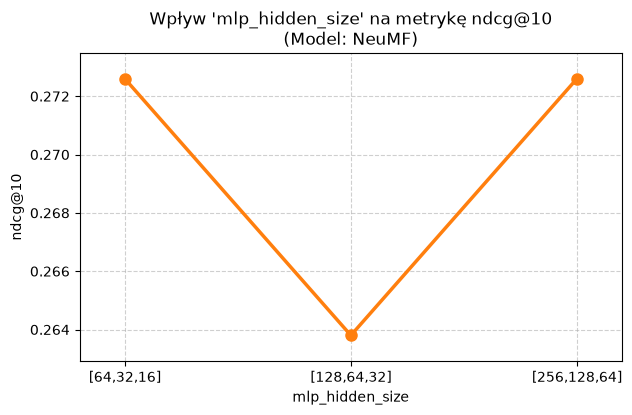

In [10]:
# Badanie wielkości warstw MLP (Multilayer Perceptron)
run_and_plot_sweep('NeuMF', '2_Experiments/Configs/ncf.yaml', 'mlp_hidden_size', ['[64,32,16]', '[128,64,32]', '[256,128,64]'])

In [ ]:
run_and_plot_sweep('NeuMF', '2_Experiments/Configs/ncf.yaml', 'dropout_prob', [0.1, 0.2, 0.3, 0.4, 0.5])


🚀 BADANIE PARAMETRU: dropout_prob (Wartości: [0.1, 0.2, 0.3, 0.4, 0.5])
 -> Trenowanie NeuMF z dropout_prob = 0.1...


Evaluate   :   0%|                                                          | 0/315 [00:00<?, ?it/s]:   4%|█▊                                              | 12/315 [00:00<00:02, 118.29it/s]:   8%|███▋                                             | 24/315 [00:00<00:02, 99.74it/s]:  11%|█████▍                                           | 35/315 [00:00<00:03, 91.33it/s]:  14%|███████                                          | 45/315 [00:00<00:03, 86.26it/s]

## 4. LightGCN (Graph Convolutional Networks)
Badanie wpływu liczby warstw konwolucyjnych na grafie oraz wagi regularyzacji $L_2$ w nowoczesnym algorytmie grafowym.


🚀 BADANIE PARAMETRU: reg_weight (Wartości: [0.01, 0.05, 0.1, 0.5, 1.0])
 -> Trenowanie LightGCN z reg_weight = 0.01...


Evaluate   :   0%|                                                          | 0/315 [00:00<?, ?it/s]:  79%|████████████████████████████████████▏         | 248/315 [00:00<00:00, 2215.20it/s]: 100%|██████████████████████████████████████████████| 315/315 [00:00<00:00, 2274.12it/s]


 -> Trenowanie LightGCN z reg_weight = 0.05...


Evaluate   :   0%|                                                          | 0/315 [00:00<?, ?it/s]:  69%|███████████████████████████████▌              | 216/315 [00:00<00:00, 2154.73it/s]: 100%|██████████████████████████████████████████████| 315/315 [00:00<00:00, 2068.86it/s]


 -> Trenowanie LightGCN z reg_weight = 0.1...


Evaluate   :   0%|                                                          | 0/315 [00:00<?, ?it/s]:  59%|███████████████████████████▏                  | 186/315 [00:00<00:00, 1859.70it/s]: 100%|██████████████████████████████████████████████| 315/315 [00:00<00:00, 2080.34it/s]


 -> Trenowanie LightGCN z reg_weight = 0.5...


Evaluate   :   0%|                                                          | 0/315 [00:00<?, ?it/s]:  57%|██████████████████████████▏                   | 179/315 [00:00<00:00, 1783.83it/s]: 100%|██████████████████████████████████████████████| 315/315 [00:00<00:00, 1890.68it/s]


 -> Trenowanie LightGCN z reg_weight = 1.0...


Evaluate   :   0%|                                                          | 0/315 [00:00<?, ?it/s]:  63%|█████████████████████████████▏                | 200/315 [00:00<00:00, 1985.40it/s]: 100%|██████████████████████████████████████████████| 315/315 [00:00<00:00, 1948.41it/s]


,reg_weight,ndcg@10
0,0.01,0.2973
1,0.05,0.2975
2,0.10,0.3031
3,0.50,0.2737
4,1.00,0.2410


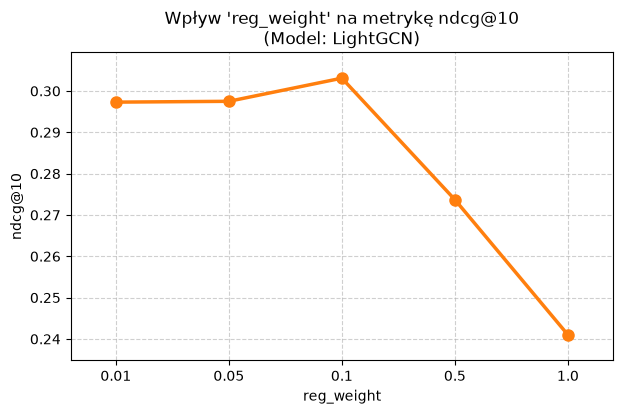

In [4]:
# Badanie siły regularyzacji (reg_weight)
run_and_plot_sweep('LightGCN', '2_Experiments/Configs/gnn.yaml', 'reg_weight', [0.01, 0.05, 0.1, 0.5, 1.0])


🚀 BADANIE PARAMETRU: n_layers (Wartości: [1, 2, 3, 4])
 -> Trenowanie LightGCN z n_layers = 1...


Evaluate   :   0%|                                                          | 0/315 [00:00<?, ?it/s]:  27%|████████████▉                                   | 85/315 [00:00<00:00, 835.62it/s]:  98%|█████████████████████████████████████████████ | 309/315 [00:00<00:00, 1644.29it/s]: 100%|██████████████████████████████████████████████| 315/315 [00:00<00:00, 1552.25it/s]


 -> Trenowanie LightGCN z n_layers = 2...


Evaluate   :   0%|                                                          | 0/315 [00:00<?, ?it/s]:  31%|███████████████                                 | 99/315 [00:00<00:00, 975.49it/s]:  76%|██████████████████████████████████▉           | 239/315 [00:00<00:00, 1219.22it/s]: 100%|██████████████████████████████████████████████| 315/315 [00:00<00:00, 1276.82it/s]


 -> Trenowanie LightGCN z n_layers = 3...


Evaluate   :   0%|                                                          | 0/315 [00:00<?, ?it/s]:  60%|███████████████████████████▍                  | 188/315 [00:00<00:00, 1845.24it/s]: 100%|██████████████████████████████████████████████| 315/315 [00:00<00:00, 1890.45it/s]


 -> Trenowanie LightGCN z n_layers = 4...


Evaluate   :   0%|                                                          | 0/315 [00:00<?, ?it/s]:  43%|███████████████████▋                          | 135/315 [00:00<00:00, 1348.22it/s]: 100%|██████████████████████████████████████████████| 315/315 [00:00<00:00, 1584.88it/s]


,n_layers,ndcg@10
0,1,0.2901
1,2,0.2994
2,3,0.2955
3,4,0.2970


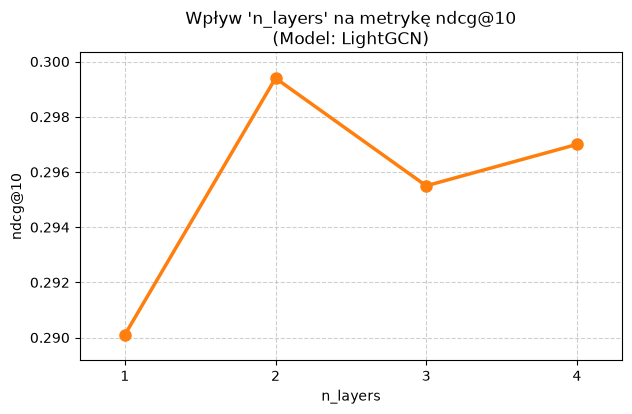

In [3]:
# Badanie liczby warstw propagacji w grafie (n_layers)
run_and_plot_sweep('LightGCN', '2_Experiments/Configs/gnn.yaml', 'n_layers', [1, 2, 3, 4])